In [12]:
library(tidyverse)
library(car)
library(ggplot2)
library(GGally)

In [2]:
ames_housing <- read.table("https://raw.githubusercontent.com/AllenCheng5186/STAT306-G14-Group-Project/refs/heads/main/data/ames-housing.csv", sep = ",", header=T)

In [3]:
df <- ames_housing |> 
    select("SalePrice",  "Overall.Qual", "Gr.Liv.Area", "Garage.Area", "Year.Built", "Lot.Area", "Bedroom.AbvGr", "Kitchen.AbvGr", "Lot.Shape")

In [5]:
head(df)

,SalePrice,Overall.Qual,Gr.Liv.Area,Garage.Area,Year.Built,Lot.Area,Bedroom.AbvGr,Kitchen.AbvGr,Lot.Shape
,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<int>,<chr>
1,215000,6,1656,528,1960,31770,3,1,IR1
2,105000,5,896,730,1961,11622,2,1,Reg
3,172000,6,1329,312,1958,14267,3,1,IR1
4,244000,7,2110,522,1968,11160,3,1,Reg
5,189900,5,1629,482,1997,13830,3,1,IR1
6,195500,6,1604,470,1998,9978,3,1,IR1


In [10]:
linear_reg = lm(SalePrice~.,data = df)
summary(linear_reg)


Call:
lm(formula = SalePrice ~ ., data = df)

Residuals:
    Min      1Q  Median      3Q     Max 
-448292  -19792   -1943   16605  273777 

Coefficients:
                Estimate Std. Error t value Pr(>|t|)    
(Intercept)   -7.836e+05  5.725e+04 -13.686  < 2e-16 ***
Overall.Qual   2.177e+04  7.700e+02  28.278  < 2e-16 ***
Gr.Liv.Area    6.569e+01  2.195e+00  29.922  < 2e-16 ***
Garage.Area    4.947e+01  4.144e+00  11.937  < 2e-16 ***
Year.Built     3.804e+02  2.982e+01  12.756  < 2e-16 ***
Lot.Area       9.555e-01  9.540e-02  10.015  < 2e-16 ***
Bedroom.AbvGr -9.221e+03  1.029e+03  -8.959  < 2e-16 ***
Kitchen.AbvGr -1.989e+04  3.364e+03  -5.913 3.74e-09 ***
Lot.ShapeIR2  -9.165e+02  4.423e+03  -0.207  0.83584    
Lot.ShapeIR3  -4.404e+04  9.443e+03  -4.664 3.25e-06 ***
Lot.ShapeReg  -4.011e+03  1.541e+03  -2.603  0.00929 ** 
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 36660 on 2918 degrees of freedom
  (1 observation deleted due to mis

              Df    Sum Sq   Mean Sq F value Pr(>F)    
Lot.Shape      3 1.714e+12 5.712e+11   98.43 <2e-16 ***
Residuals   2926 1.698e+13 5.803e+09                   
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

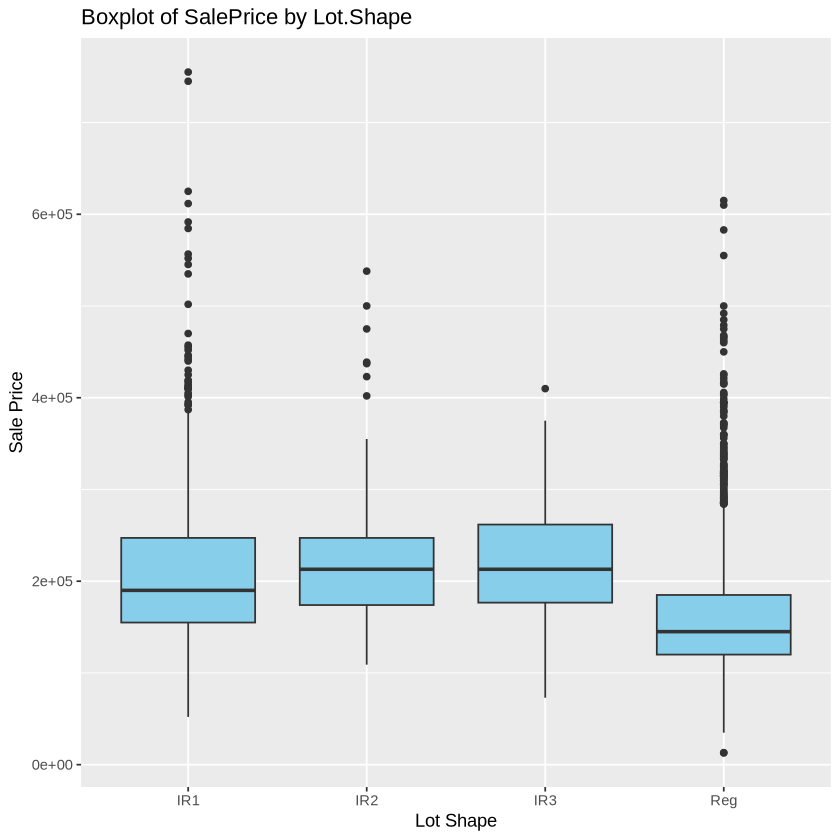

In [27]:
ggplot(df, aes(x = Lot.Shape, y = SalePrice)) +
  geom_boxplot(fill = "skyblue") +
  labs(title = "Boxplot of SalePrice by Lot.Shape",
       x = "Lot Shape",
       y = "Sale Price")
anova_result <- aov(SalePrice ~ Lot.Shape, data = df)
summary(anova_result)

Warning message:
“`aes_string()` was deprecated in ggplot2 3.0.0.
ℹ Please use tidy evaluation idioms with `aes()`.
ℹ See also `vignette("ggplot2-in-packages")` for more information.”
`geom_smooth()` using formula = 'y ~ x'
`geom_smooth()` using formula = 'y ~ x'


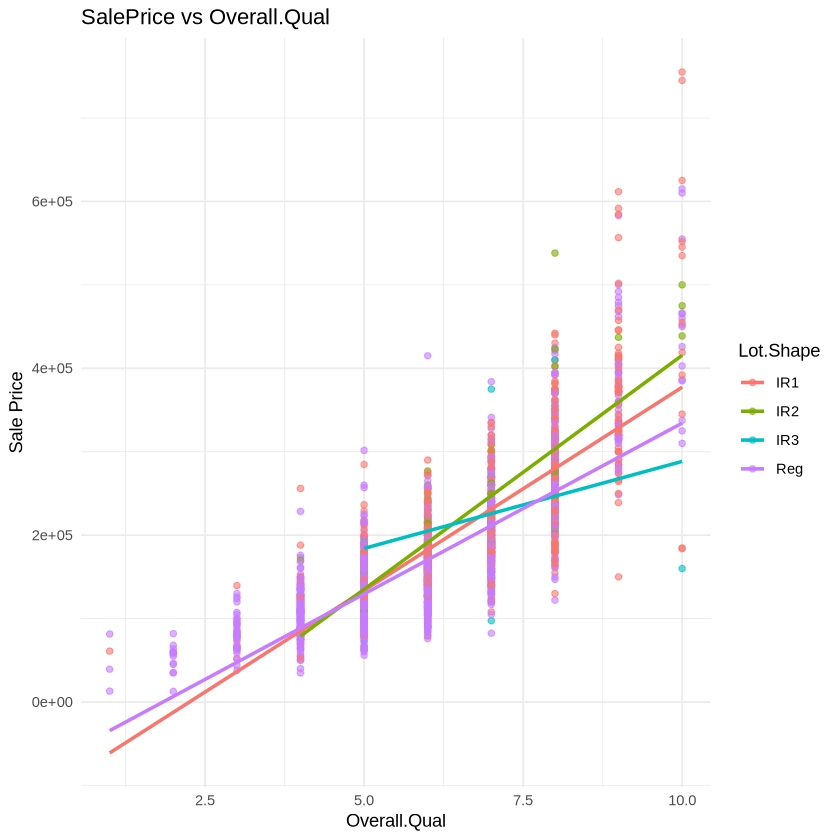

`geom_smooth()` using formula = 'y ~ x'
Warning message:
“Removed 1 row containing non-finite outside the scale range (`stat_smooth()`).”
Warning message:
“Removed 1 row containing missing values or values outside the scale range
(`geom_point()`).”


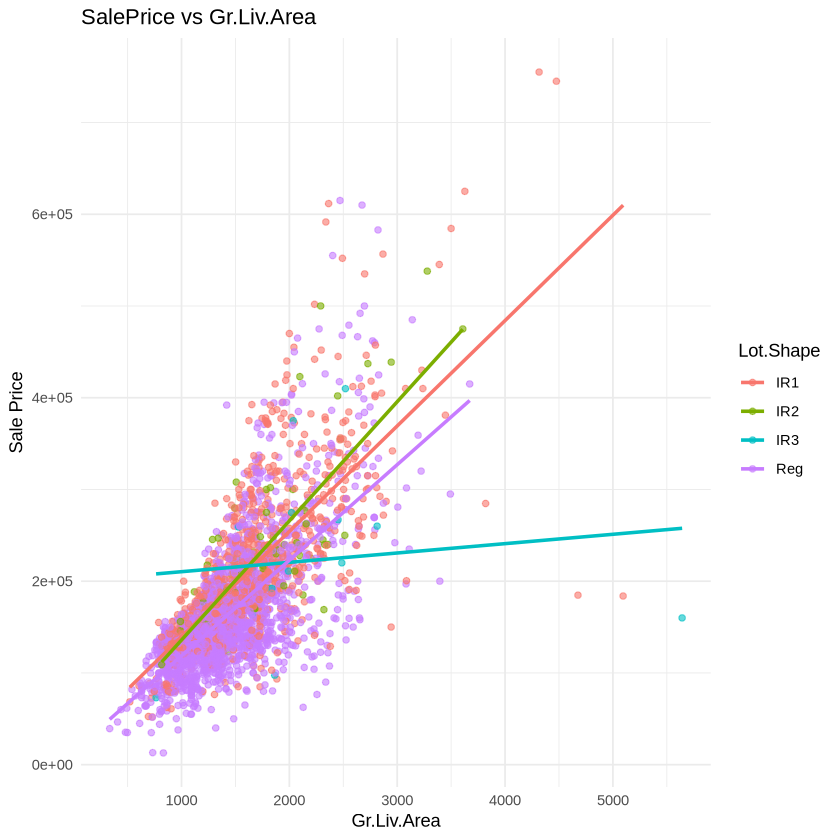

`geom_smooth()` using formula = 'y ~ x'


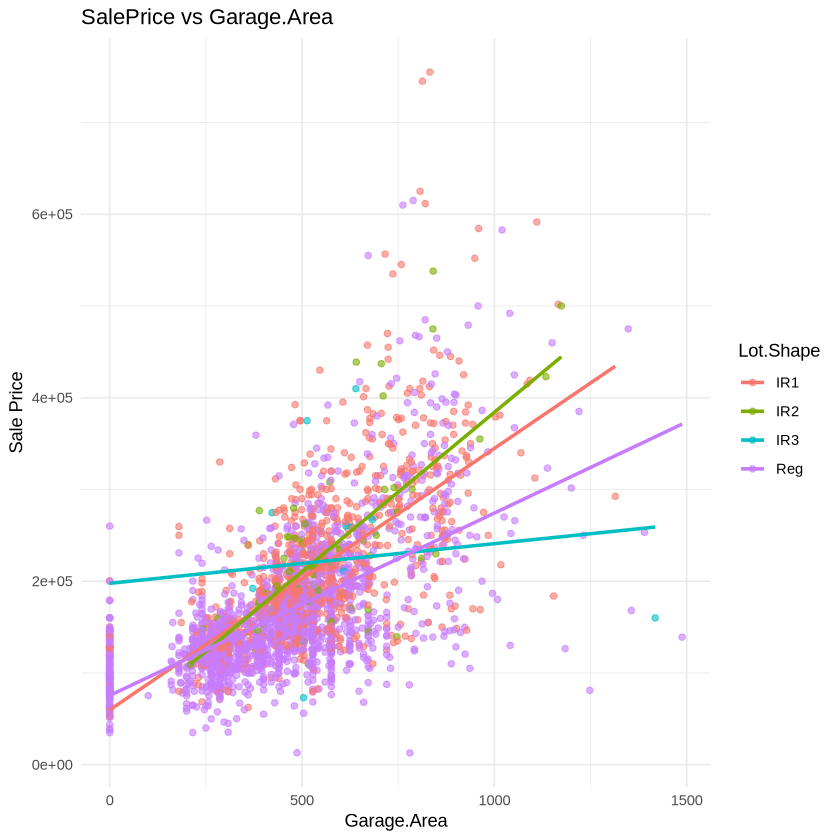

`geom_smooth()` using formula = 'y ~ x'


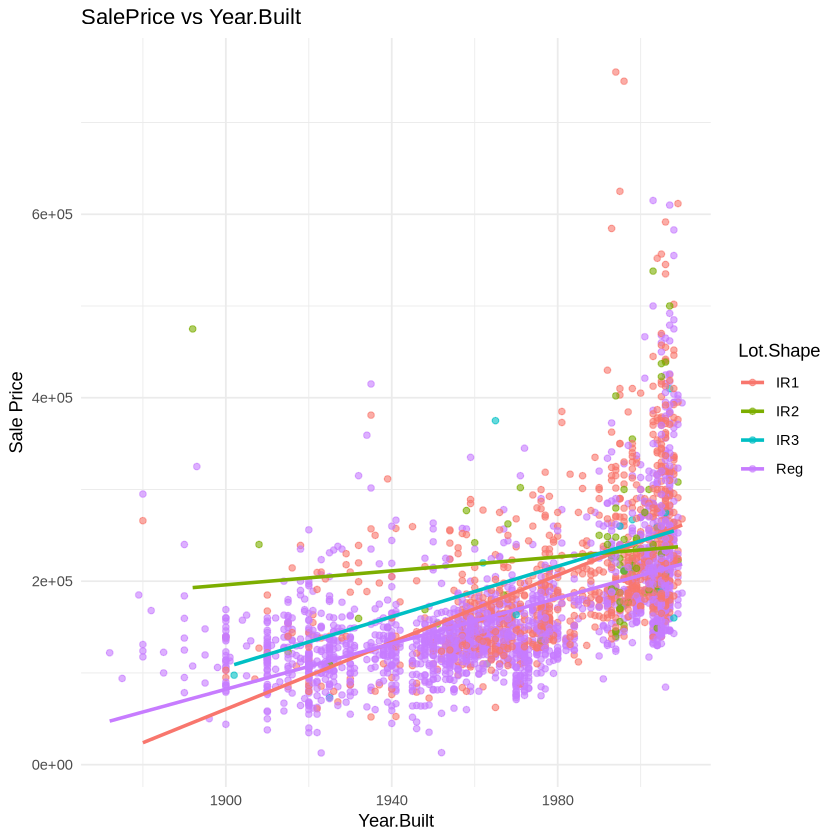

`geom_smooth()` using formula = 'y ~ x'


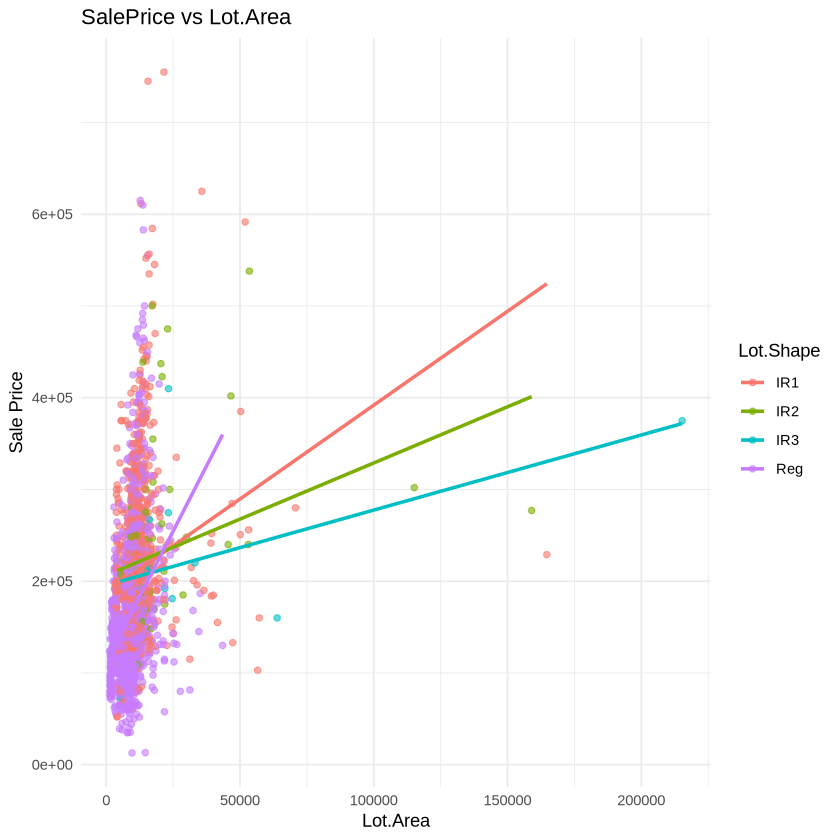

`geom_smooth()` using formula = 'y ~ x'


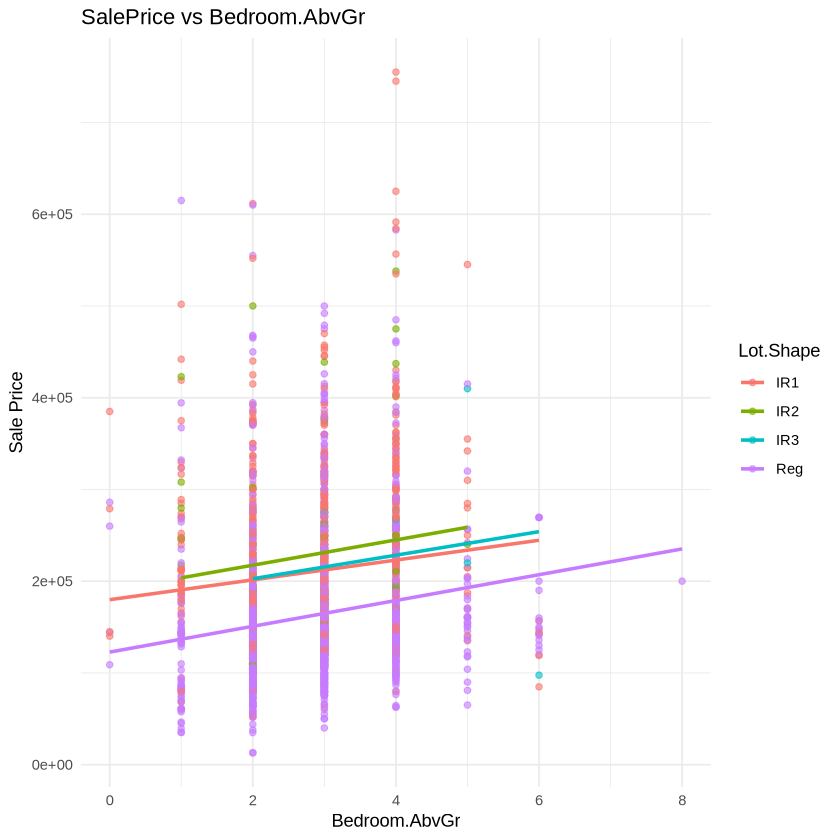

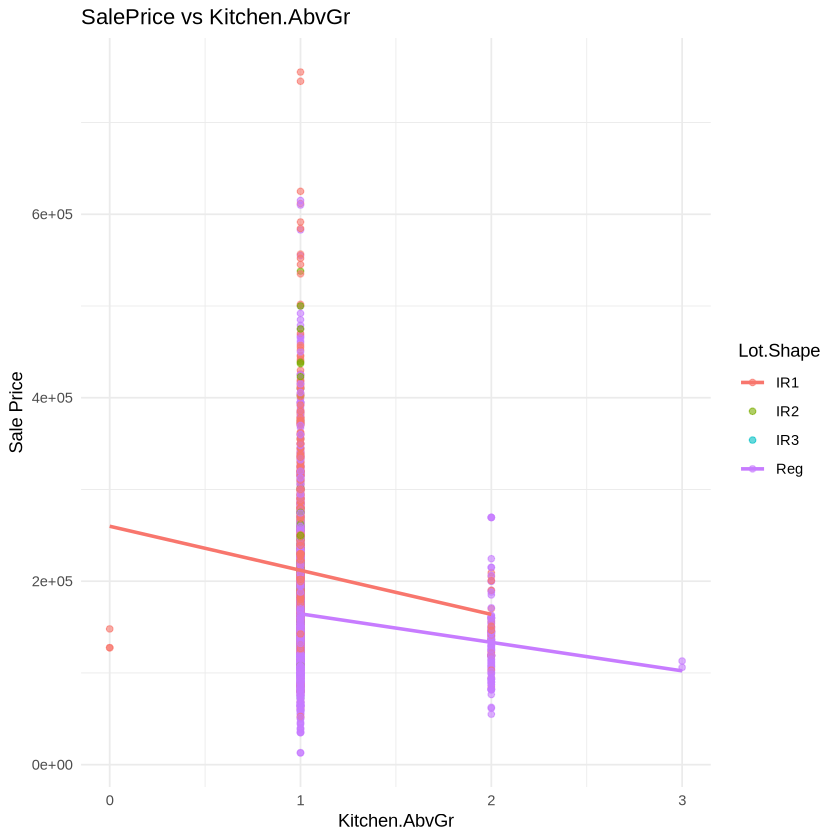

In [16]:
numeric_covariates <- names(df)[sapply(df, is.numeric) & names(df) != "SalePrice"]

for (var in numeric_covariates) {
  p <- ggplot(df, aes_string(x = var, y = "SalePrice", color = "Lot.Shape")) +
    geom_point(alpha = 0.6) +
    geom_smooth(method = "lm", se = FALSE) +
    labs(title = paste("SalePrice vs", var),
         x = var, y = "Sale Price") +
    theme_minimal()
  
  print(p)
}

In [25]:
vif_model <- lm(SalePrice ~ ., data = df)

vif_values <- vif(vif_model)

vif_values

,GVIF,Df,GVIF^(1/(2*Df))
Overall.Qual,2.572118,1,1.603782
Gr.Liv.Area,2.683615,1,1.638174
Garage.Area,1.730249,1,1.315389
Year.Built,1.771459,1,1.330962
Lot.Area,1.231633,1,1.109790
Bedroom.AbvGr,1.581546,1,1.257595
Kitchen.AbvGr,1.130022,1,1.063025
Lot.Shape,1.243494,3,1.036988
